In [ ]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Configuración de estilo visual
sns.set_theme(style="whitegrid", palette="muted")
plt.rcParams['font.sans-serif'] = 'DejaVu Sans'
plt.rcParams['axes.edgecolor'] = '#cccccc'
plt.rcParams['axes.linewidth'] = 0.8

ruta_dataset_1 = "social_media_addiction_mental_wellbeing.csv"
ruta_dataset_2 = "social_media_mental_health.csv"

# Cargar los datasets en DataFrames de Pandas
mwb_org = pd.read_csv(ruta_dataset_1)
ma_org = pd.read_csv(ruta_dataset_2)




In [27]:
def analizar_dataframe(df, nombre_df):

    print(f"\n==================================================")
    print(f"       GENERANDO ANÁLISIS PARA: {nombre_df}")
    print(f"==================================================")

    # ----------------------------------------------------
    # SELECCIÓN DE VARIABLES NUMÉRICAS
    # ----------------------------------------------------
    cols_num = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    # Eliminar IDs
    cols_num = [c for c in cols_num if 'id' not in c.lower()]

    if not cols_num:
        print(f"No se encontraron columnas numéricas en {nombre_df}.")
        return

    

    # ----------------------------------------------------
    # A. HISTOGRAMAS
    # ----------------------------------------------------
    num_cols = len(cols_num)
    fig_cols = 3
    fig_rows = (num_cols + fig_cols - 1) // fig_cols

    fig, axes = plt.subplots(
        fig_rows,
        fig_cols,
        figsize=(5 * fig_cols, 4 * fig_rows)
    )

    fig.suptitle(
        f'Histogramas de Variables Numéricas - {nombre_df}',
        fontsize=16,
        fontweight='bold'
    )

    axes_flat = axes.flatten() if num_cols > 1 else [axes]

    for idx, col in enumerate(cols_num):

        sns.histplot(
            df[col],
            kde=True,
            ax=axes_flat[idx],
            color='steelblue',
            bins=15
        )

        axes_flat[idx].set_title(
            f'Distribución: {col}',
            fontweight='bold'
        )

        axes_flat[idx].set_xlabel(col)
        axes_flat[idx].set_ylabel('Frecuencia')

    # Eliminar subplots vacíos
    for idx in range(num_cols, len(axes_flat)):
        fig.delaxes(axes_flat[idx])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # ----------------------------------------------------
    # B. BOXPLOTS
    # ----------------------------------------------------
    plt.figure(figsize=(14, len(cols_num) * 2))

    for i, col in enumerate(cols_num, 1):

        plt.subplot(
            (len(cols_num) + 1) // 2,
            2,
            i
        )

        sns.boxplot(
            x=df[col],
            color='skyblue'
        )

        plt.title(f'Boxplot de {col}')
        plt.xlabel(col)

    plt.tight_layout()
    plt.show()

    # ----------------------------------------------------
    # C. MATRIZ DE CORRELACIÓN
    # ----------------------------------------------------
    plt.figure(figsize=(10, 8))

    matriz_corr = df[cols_num].corr()

    sns.heatmap(
        matriz_corr,
        annot=True,
        fmt=".2f",
        cmap='coolwarm',
        vmin=-1,
        vmax=1,
        linewidths=0.5,
        cbar_kws={"shrink": .8}
    )

    plt.title(
        f'Matriz de Correlación - {nombre_df}',
        fontsize=14,
        fontweight='bold',
        pad=15
    )

    plt.tight_layout()
    plt.show()

In [30]:

# ----------------------------------------------------
    # D. SCATTERPLOTS VS VARIABLE OBJETIVO
    # ----------------------------------------------------
def analizar_corr_target(df, nombre_df, target='Mental_Wellbeing_Score'):
    cols_num = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    
    # Eliminar IDs
    cols_num = [c for c in cols_num if 'id' not in c.lower()]
    
    if not cols_num:
        print(f"No se encontraron columnas numéricas en {nombre_df}.")
        return
    # Comprobar que existe la variable objetivo
    if target not in df.columns:
        print(f"No se encontró la variable objetivo '{target}' en {nombre_df}.")
        return
    
    # ----------------------------------------------------
    # CORRELACIONES CON LA VARIABLE OBJETIVO
    # ----------------------------------------------------
    print(f"\nCorrelación con {target}:")
    
    correlaciones_target = (
        df[cols_num]
        .corr()[target]
        .sort_values(ascending=False)
    )
    
    print(correlaciones_target)

    print(f"\n==================================================")
    print(f"   SCATTERPLOTS VS {target}: {nombre_df}")
    print(f"==================================================")

    # Excluir la propia variable objetivo
    scatter_cols = [
        c for c in cols_num
        if c != target
    ]

    if not scatter_cols:
        print("No hay variables numéricas para comparar con el objetivo.")
        return

    num_cols = len(scatter_cols)
    fig_cols = 3
    fig_rows = (num_cols + fig_cols - 1) // fig_cols

    fig, axes = plt.subplots(
        fig_rows,
        fig_cols,
        figsize=(5 * fig_cols, 4 * fig_rows)
    )

    fig.suptitle(
        f'Relación con {target} - {nombre_df}',
        fontsize=16,
        fontweight='bold'
    )

    axes_flat = axes.flatten() if num_cols > 1 else [axes]

    for idx, col in enumerate(scatter_cols):

        sns.regplot(
            data=df,
            x=col,
            y=target,
            ax=axes_flat[idx],
            scatter_kws={'alpha': 0.5},
            line_kws={'linewidth': 2}
        )

        axes_flat[idx].set_title(
            f'{col} vs {target}',
            fontweight='bold'
        )

        axes_flat[idx].set_xlabel(col)
        axes_flat[idx].set_ylabel(target)

    # Eliminar subplots vacíos
    for idx in range(num_cols, len(axes_flat)):
        fig.delaxes(axes_flat[idx])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [ ]:
def analizar_categoricas(df, nombre_df, target="Mental_Wellbeing_Score"):

    print(f"\n==================================================")
    print(f"   ANÁLISIS DE VARIABLES CATEGÓRICAS: {nombre_df}")
    print(f"==================================================")

    # ----------------------------------------------------
    # SELECCIÓN DE VARIABLES CATEGÓRICAS
    # ----------------------------------------------------
    cols_cat = df.select_dtypes(
        include=['object', 'category', 'bool']
    ).columns.tolist()

    # Eliminar IDs
    cols_cat = [c for c in cols_cat if 'id' not in c.lower()]

    if not cols_cat:
        print("No se encontraron variables categóricas.")
        return

    if target not in df.columns:
        print(f"No se encontró la variable objetivo '{target}'.")
        return

    # ====================================================
    # A. DISTRIBUCIÓN DE VARIABLES CATEGÓRICAS
    # ====================================================

    print("\nGenerando distribución de variables categóricas...")

    num_cols = len(cols_cat)
    fig_cols = 3
    fig_rows = (num_cols + fig_cols - 1) // fig_cols

    fig, axes = plt.subplots(
        fig_rows,
        fig_cols,
        figsize=(6 * fig_cols, 4.5 * fig_rows)
    )

    fig.suptitle(
        f'Distribución de Variables Categóricas - {nombre_df}',
        fontsize=16,
        fontweight='bold'
    )

    axes_flat = axes.flatten() if num_cols > 1 else [axes]

    for idx, col in enumerate(cols_cat):

        sns.countplot(
            data=df,
            x=col,
            ax=axes_flat[idx]
        )

        axes_flat[idx].set_title(
            f'Distribución de {col}',
            fontweight='bold'
        )

        axes_flat[idx].set_xlabel(col)
        axes_flat[idx].set_ylabel('Frecuencia')

        axes_flat[idx].tick_params(axis='x', rotation=45)

    # Eliminar subplots vacíos
    for idx in range(num_cols, len(axes_flat)):
        fig.delaxes(axes_flat[idx])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    # ====================================================
    # B. VARIABLES CATEGÓRICAS VS TARGET
    # ====================================================

    print(f"\nGenerando boxplots de las variables categóricas vs {target}...")

    fig, axes = plt.subplots(
        fig_rows,
        fig_cols,
        figsize=(6 * fig_cols, 4.5 * fig_rows)
    )

    fig.suptitle(
        f'{target} según Variables Categóricas - {nombre_df}',
        fontsize=16,
        fontweight='bold'
    )

    axes_flat = axes.flatten() if num_cols > 1 else [axes]

    for idx, col in enumerate(cols_cat):

        sns.boxplot(
            data=df,
            x=col,
            y=target,
            ax=axes_flat[idx]
        )

        axes_flat[idx].set_title(
            f'{target} según {col}',
            fontweight='bold'
        )

        axes_flat[idx].set_xlabel(col)
        axes_flat[idx].set_ylabel(target)

        axes_flat[idx].tick_params(
            axis='x',
            rotation=45
        )

    for idx in range(num_cols, len(axes_flat)):
        fig.delaxes(axes_flat[idx])

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


       GENERANDO ANÁLISIS PARA: Dataset MWB (Mental Wellbeing) Original


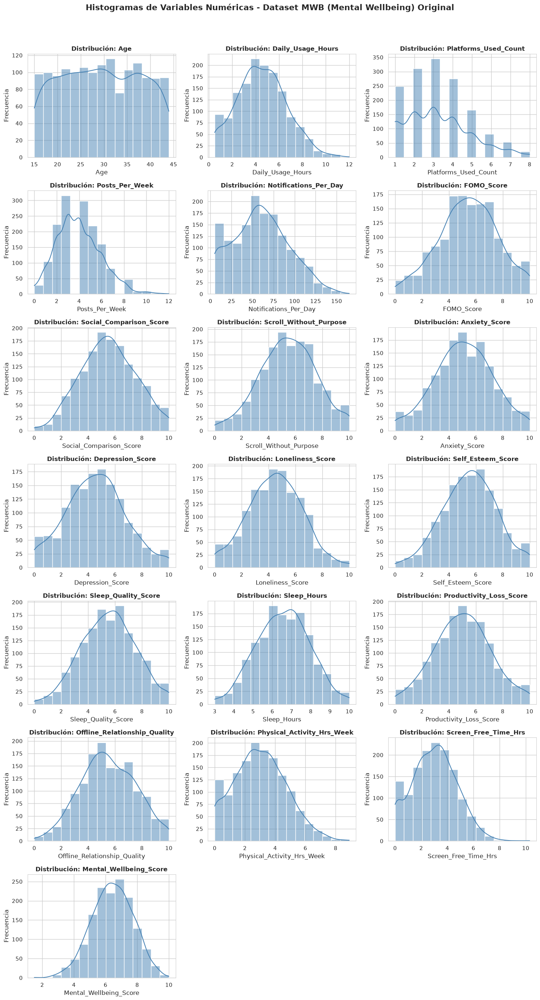

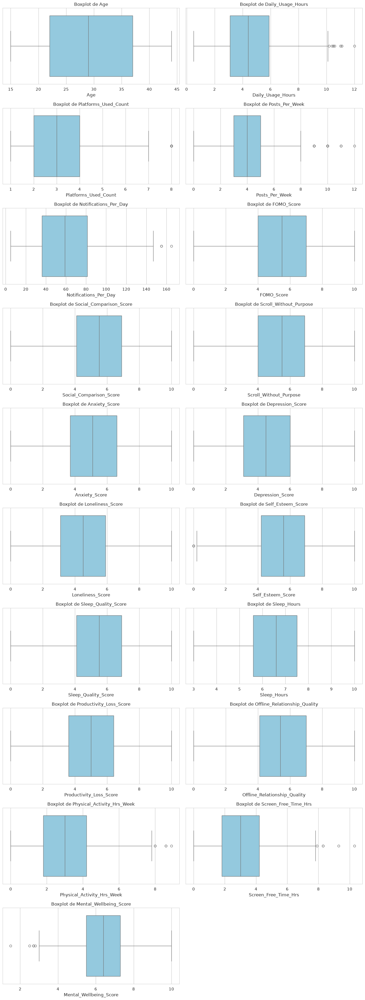

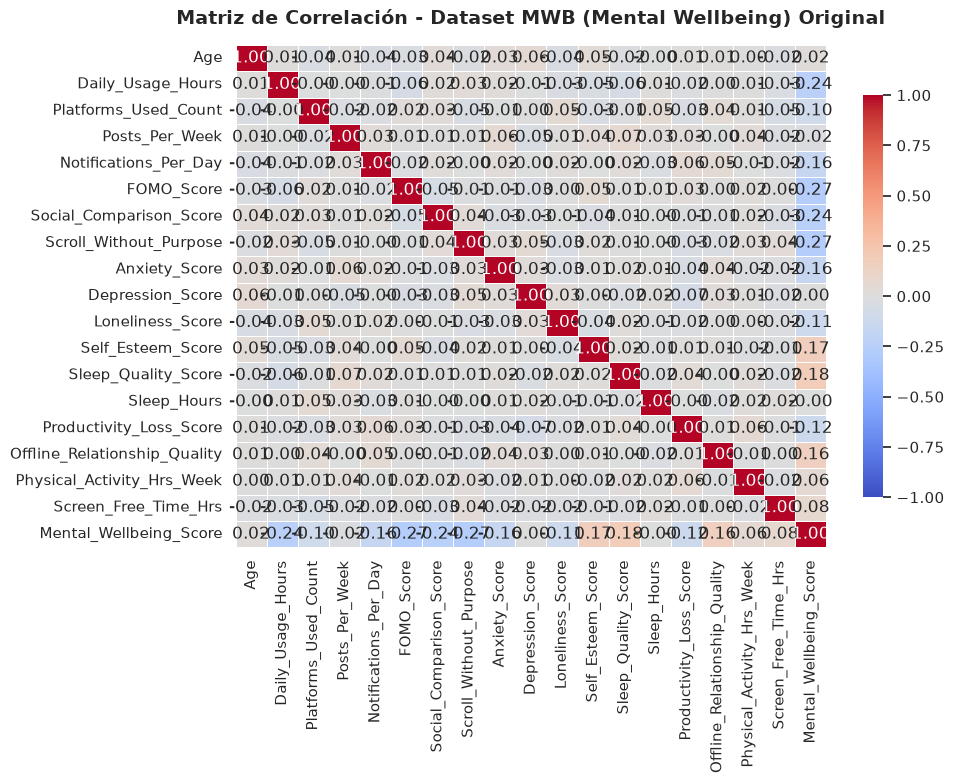


Correlación con Mental_Wellbeing_Score:
Mental_Wellbeing_Score          1.000000
Sleep_Quality_Score             0.184336
Self_Esteem_Score               0.169582
Offline_Relationship_Quality    0.161270
Screen_Free_Time_Hrs            0.076667
Physical_Activity_Hrs_Week      0.061419
Age                             0.017589
Depression_Score                0.002524
Sleep_Hours                    -0.002795
Posts_Per_Week                 -0.019171
Platforms_Used_Count           -0.096764
Loneliness_Score               -0.114510
Productivity_Loss_Score        -0.119860
Notifications_Per_Day          -0.157749
Anxiety_Score                  -0.162294
Daily_Usage_Hours              -0.236475
Social_Comparison_Score        -0.244639
FOMO_Score                     -0.269426
Scroll_Without_Purpose         -0.269470
Name: Mental_Wellbeing_Score, dtype: float64

   SCATTERPLOTS VS Mental_Wellbeing_Score: Dataset MWB (Mental Wellbeing) Original


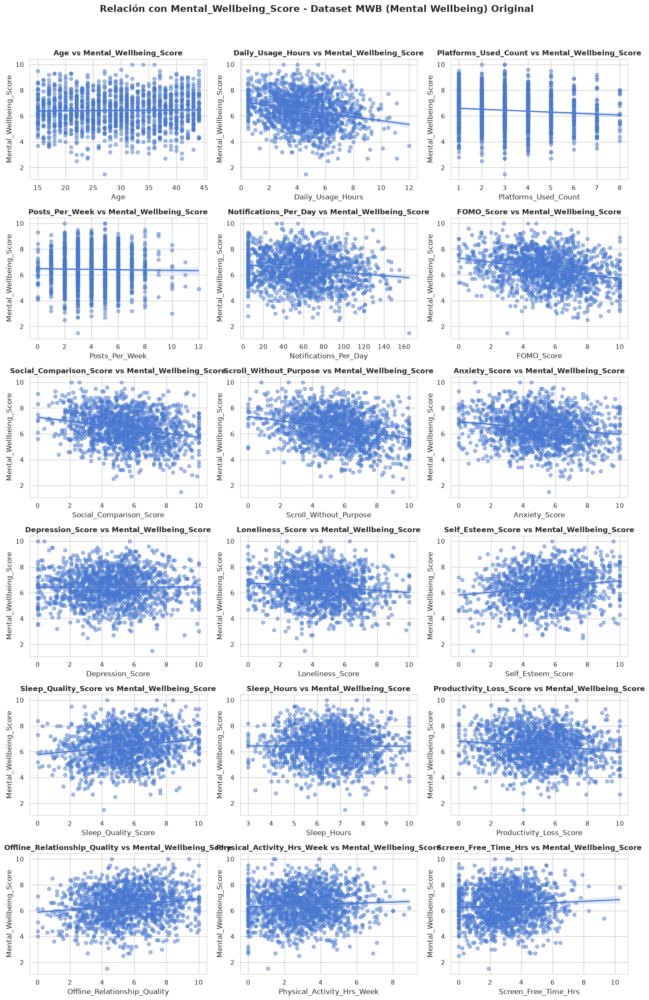


   ANÁLISIS DE VARIABLES CATEGÓRICAS: Dataset MWB (Mental Wellbeing) Original

Generando distribución de variables categóricas...


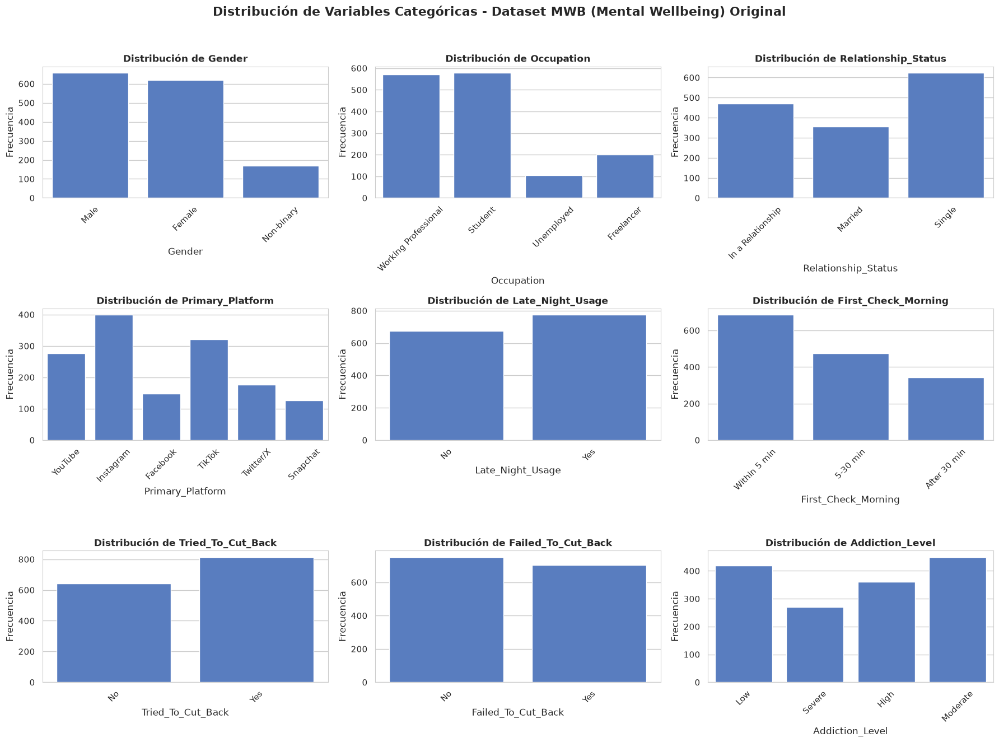


Generando boxplots de las variables categóricas vs Mental_Wellbeing_Score...


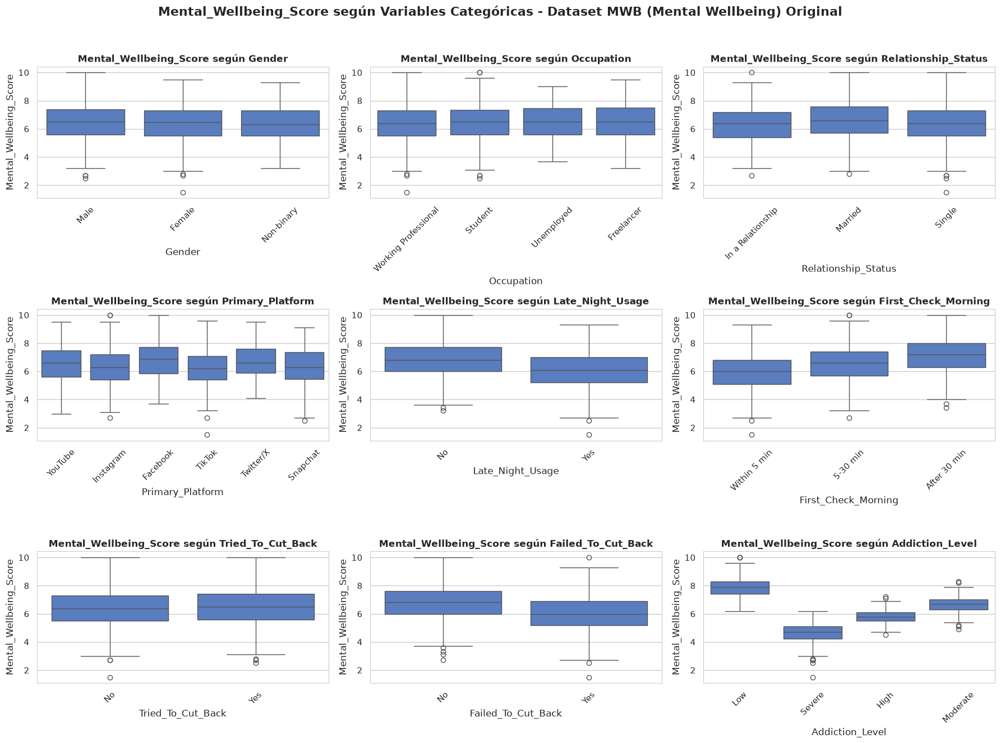

In [41]:
analizar_dataframe(mwb_org,"Dataset MWB (Mental Wellbeing) Original")
analizar_corr_target(mwb_org,"Dataset MWB (Mental Wellbeing) Original")
analizar_categoricas(mwb_org,"Dataset MWB (Mental Wellbeing) Original")


       GENERANDO ANÁLISIS PARA: Dataset MWB (Mental Wellbeing)


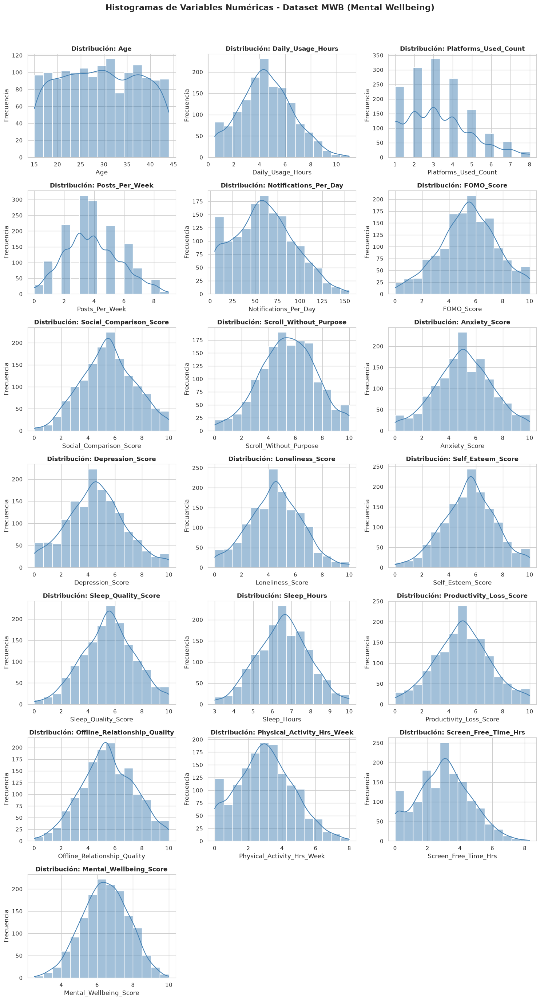

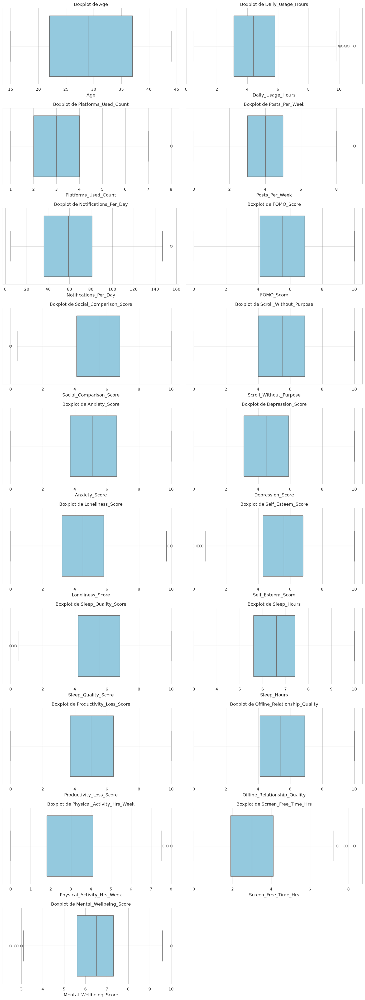

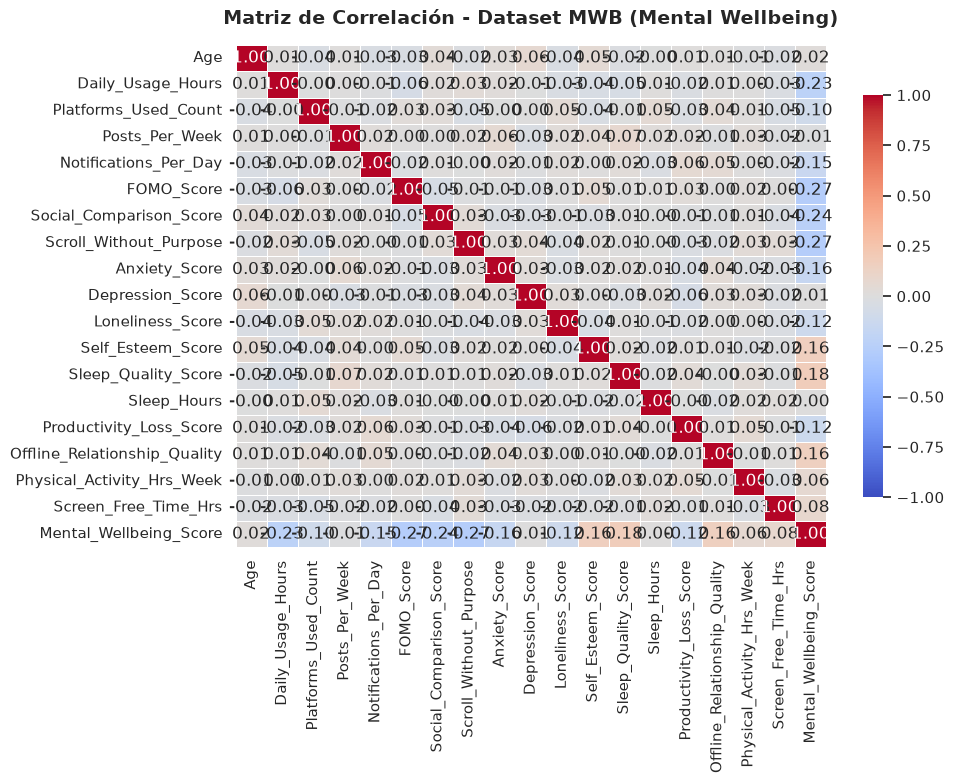


Correlación con Mental_Wellbeing_Score:
Mental_Wellbeing_Score          1.000000
Sleep_Quality_Score             0.178243
Self_Esteem_Score               0.159490
Offline_Relationship_Quality    0.156117
Screen_Free_Time_Hrs            0.078886
Physical_Activity_Hrs_Week      0.063048
Age                             0.017956
Depression_Score                0.006846
Sleep_Hours                     0.001416
Posts_Per_Week                 -0.010895
Platforms_Used_Count           -0.099450
Loneliness_Score               -0.116880
Productivity_Loss_Score        -0.118028
Notifications_Per_Day          -0.147800
Anxiety_Score                  -0.156857
Daily_Usage_Hours              -0.225371
Social_Comparison_Score        -0.236465
Scroll_Without_Purpose         -0.266687
FOMO_Score                     -0.269779
Name: Mental_Wellbeing_Score, dtype: float64

   SCATTERPLOTS VS Mental_Wellbeing_Score: Dataset MWB (Mental Wellbeing)


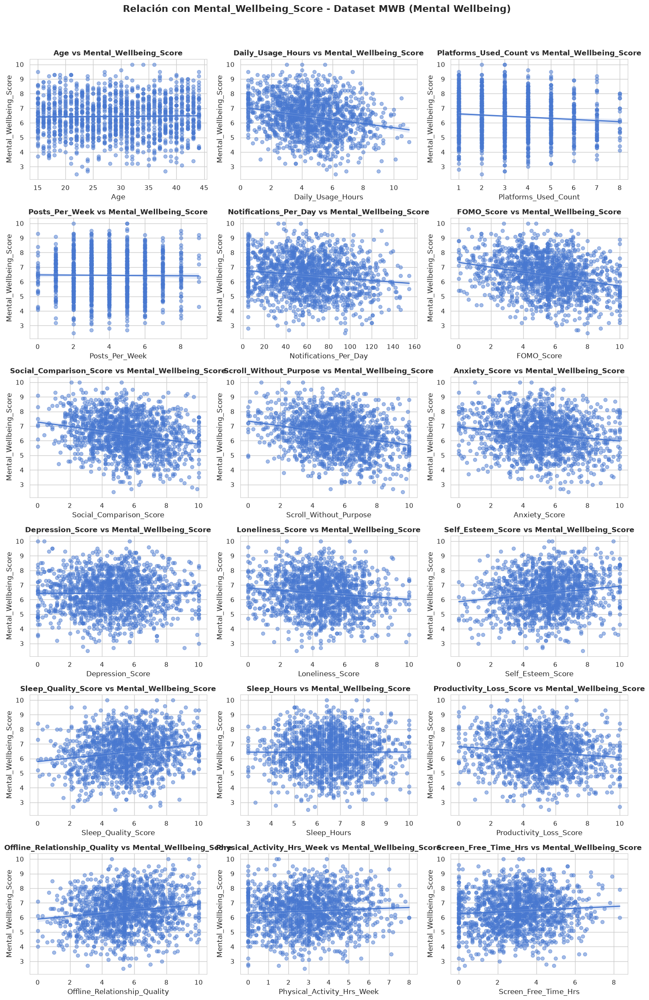


   ANÁLISIS DE VARIABLES CATEGÓRICAS: Dataset MWB (Mental Wellbeing)

Generando distribución de variables categóricas...


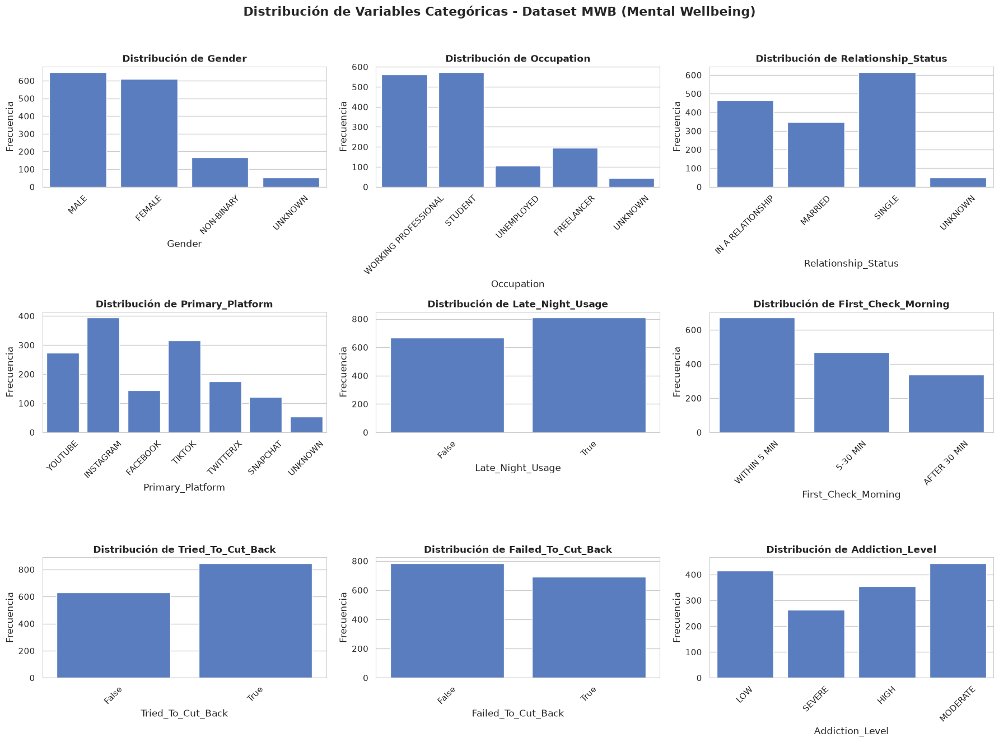


Generando boxplots de las variables categóricas vs Mental_Wellbeing_Score...


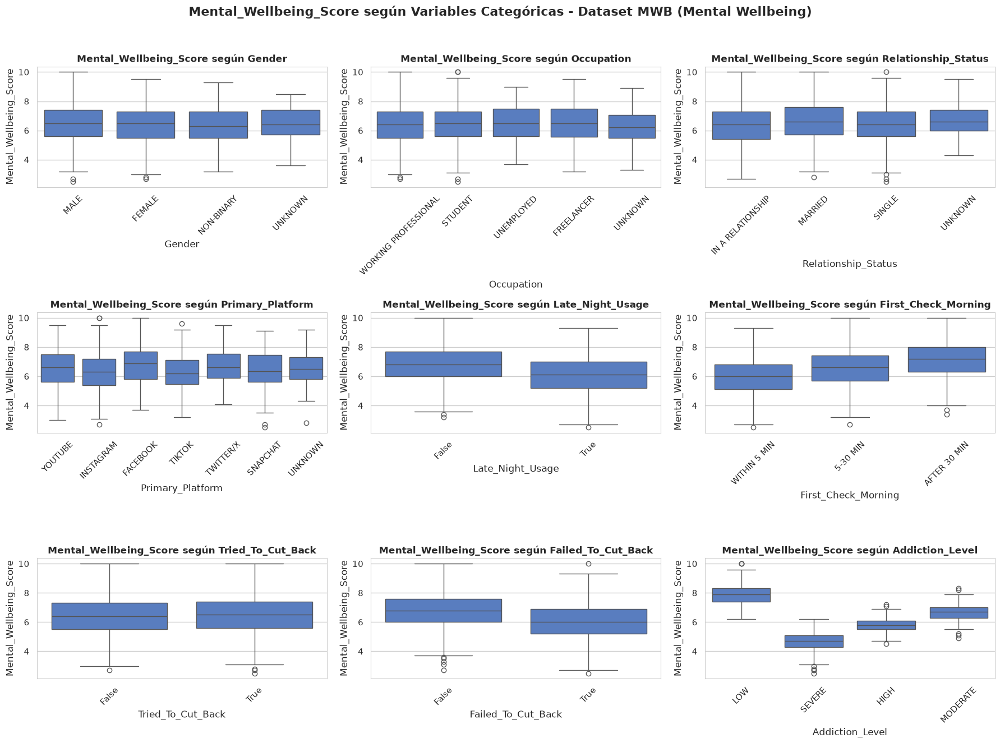

In [42]:
analizar_dataframe(mwb_df, "Dataset MWB (Mental Wellbeing)")
analizar_corr_target(mwb_df,"Dataset MWB (Mental Wellbeing)")
analizar_categoricas(mwb_df,"Dataset MWB (Mental Wellbeing)")


       GENERANDO ANÁLISIS PARA: Dataset mental addiction Original


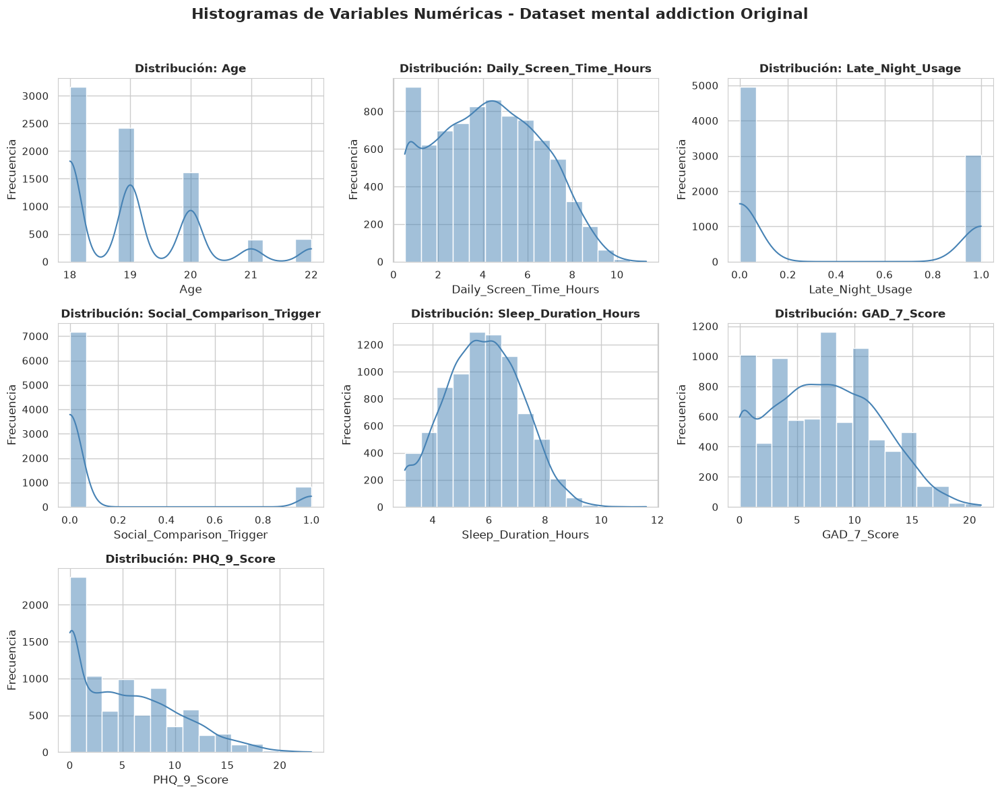

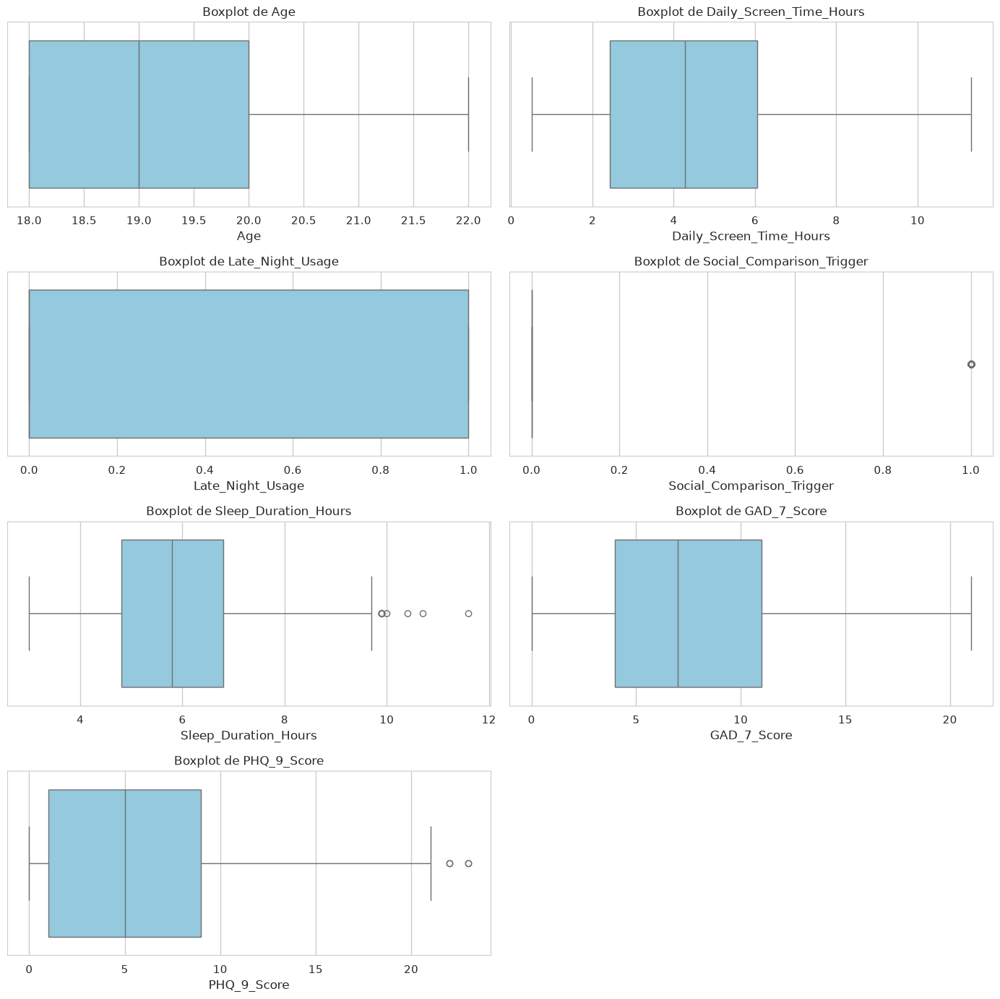

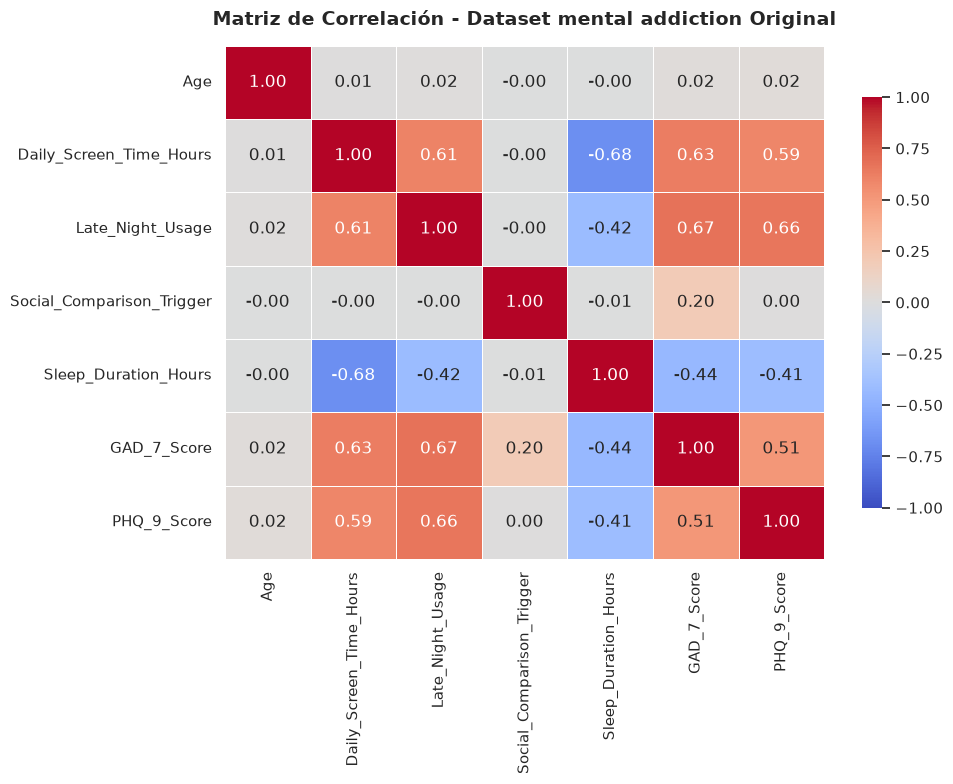


Correlación con GAD_7_Score:
GAD_7_Score                  1.000000
Late_Night_Usage             0.674428
Daily_Screen_Time_Hours      0.631932
PHQ_9_Score                  0.509629
Social_Comparison_Trigger    0.198087
Age                          0.018248
Sleep_Duration_Hours        -0.439734
Name: GAD_7_Score, dtype: float64

   SCATTERPLOTS VS GAD_7_Score: Dataset mental addiction Original


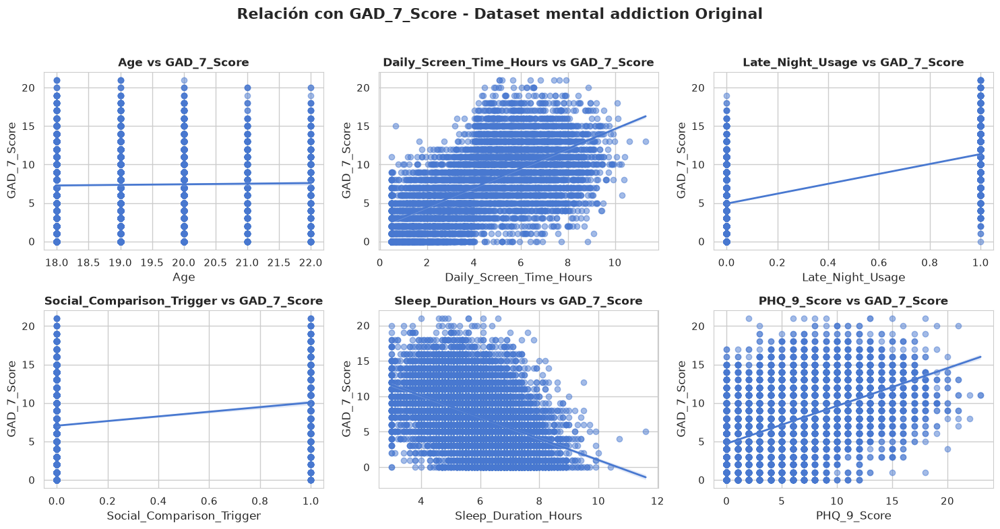


Correlación con PHQ_9_Score:
PHQ_9_Score                  1.000000
Late_Night_Usage             0.661217
Daily_Screen_Time_Hours      0.593643
GAD_7_Score                  0.509629
Age                          0.024564
Social_Comparison_Trigger    0.003618
Sleep_Duration_Hours        -0.413923
Name: PHQ_9_Score, dtype: float64

   SCATTERPLOTS VS PHQ_9_Score: Dataset mental addiction Original


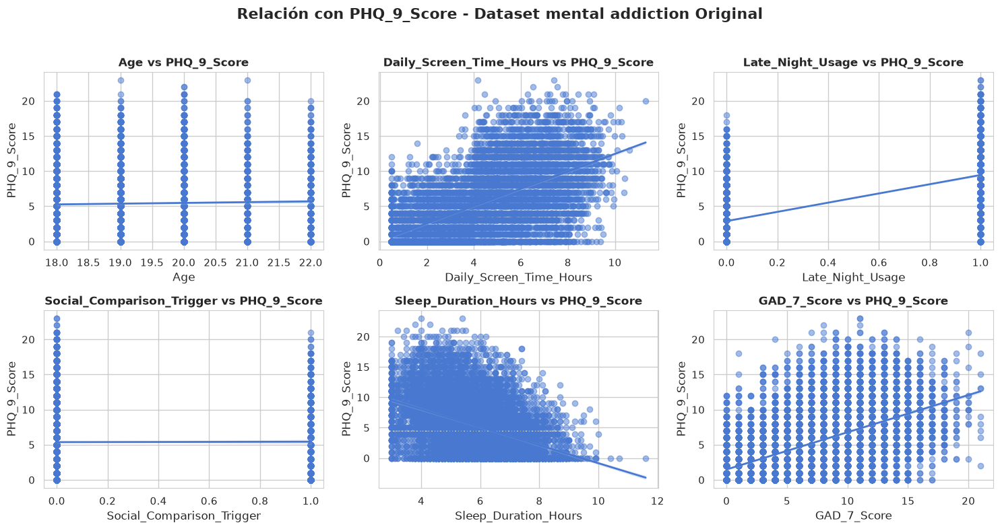


   ANÁLISIS DE VARIABLES CATEGÓRICAS: Dataset mental addiction Original

Generando distribución de variables categóricas...


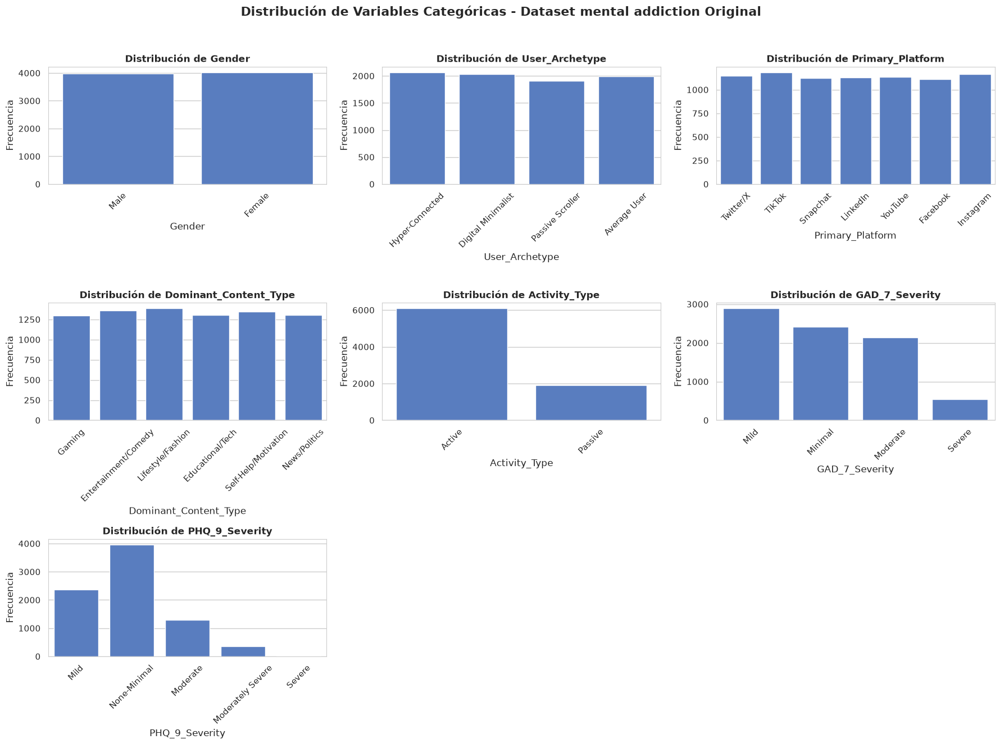


Generando boxplots de las variables categóricas vs GAD_7_Score...


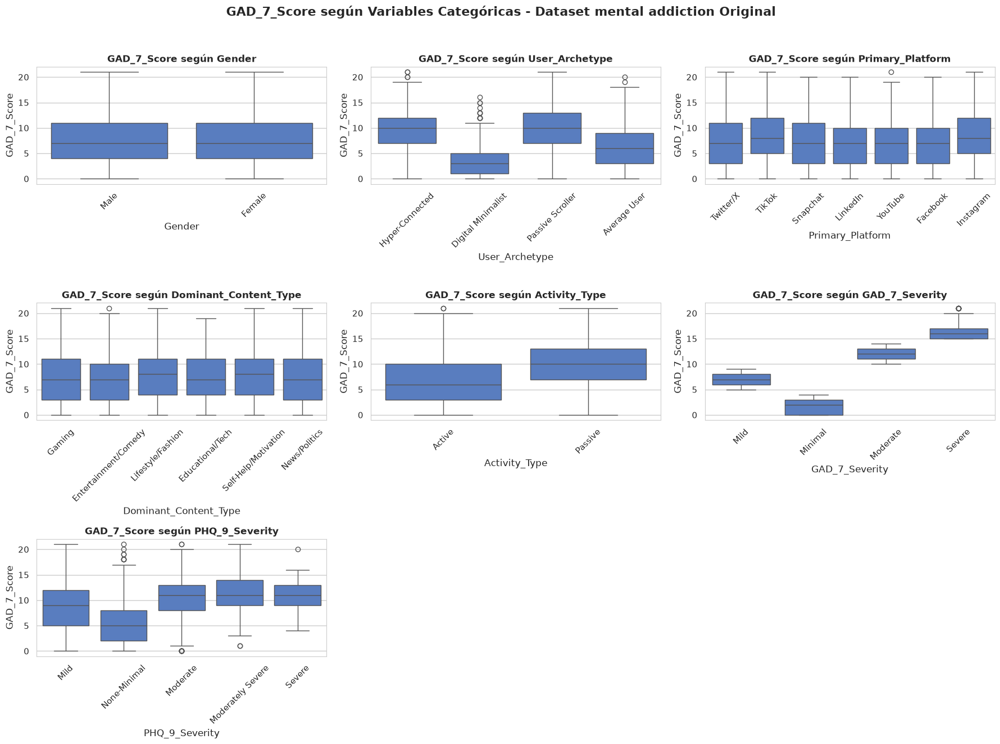


   ANÁLISIS DE VARIABLES CATEGÓRICAS: Dataset mental addiction Original

Generando distribución de variables categóricas...


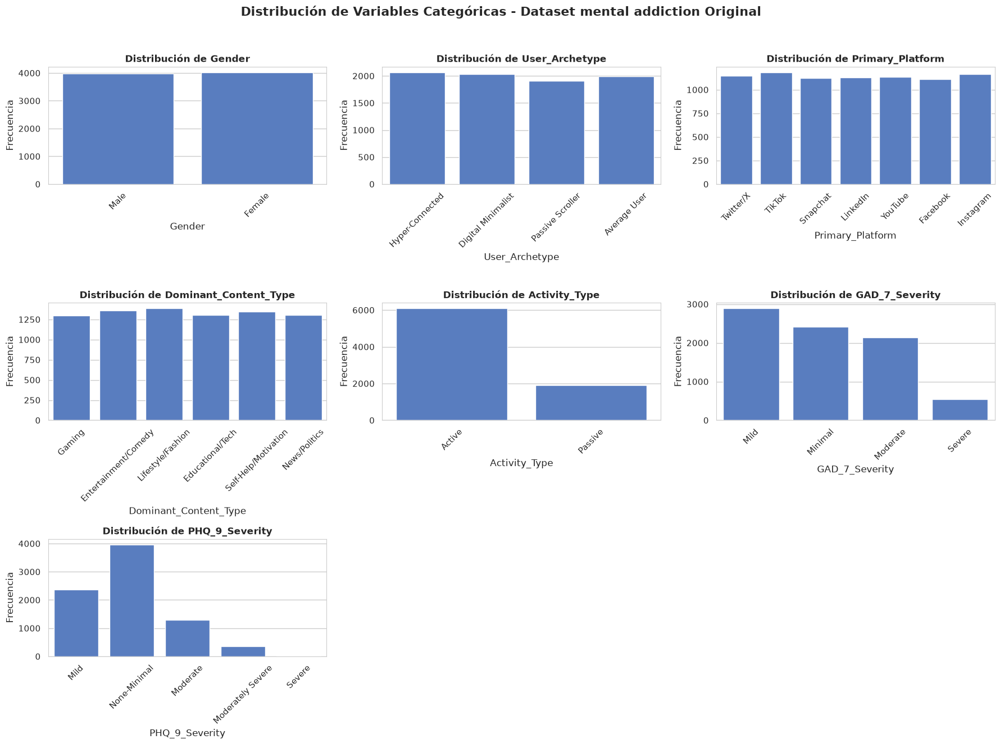


Generando boxplots de las variables categóricas vs PHQ_9_Score...


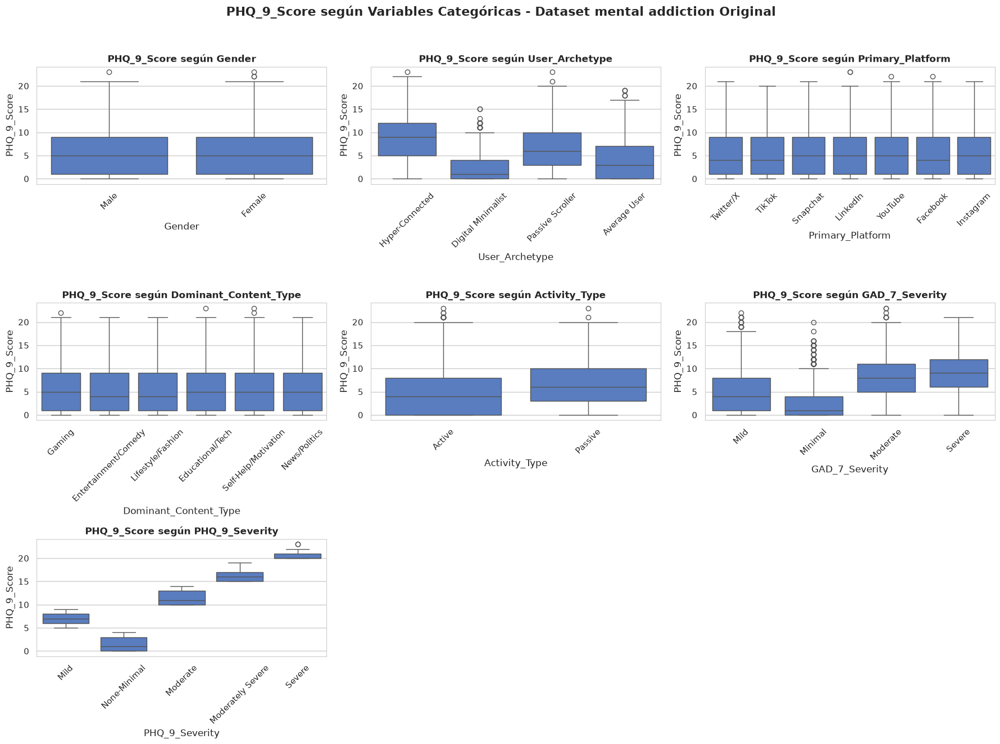

In [43]:
analizar_dataframe(ma_org,"Dataset mental addiction Original")
analizar_corr_target(ma_org,"Dataset mental addiction Original",target = "GAD_7_Score")
analizar_corr_target(ma_org,"Dataset mental addiction Original",target = "PHQ_9_Score")
analizar_categoricas(ma_org,"Dataset mental addiction Original", target = "GAD_7_Score")
analizar_categoricas(ma_org,"Dataset mental addiction Original", target = "PHQ_9_Score")




       GENERANDO ANÁLISIS PARA: Dataset MA (Mental Addiction)


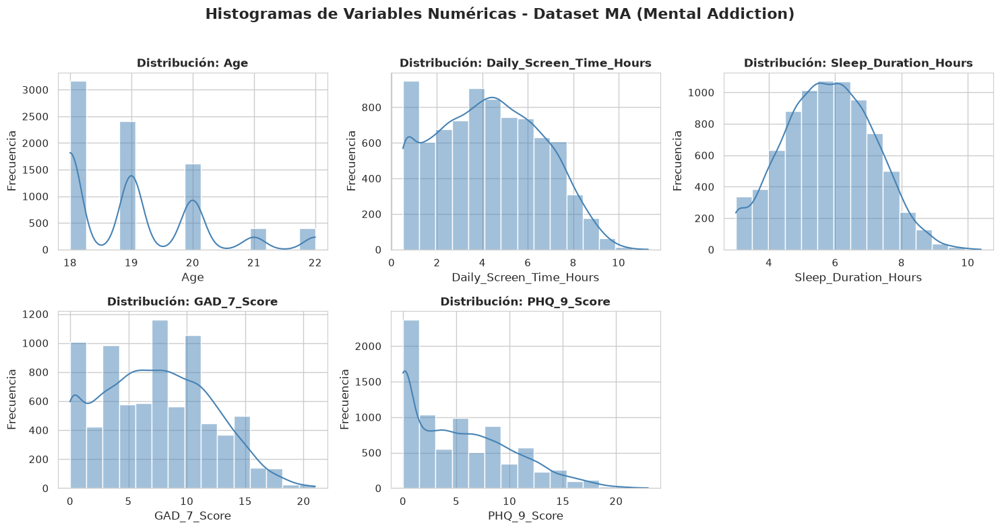

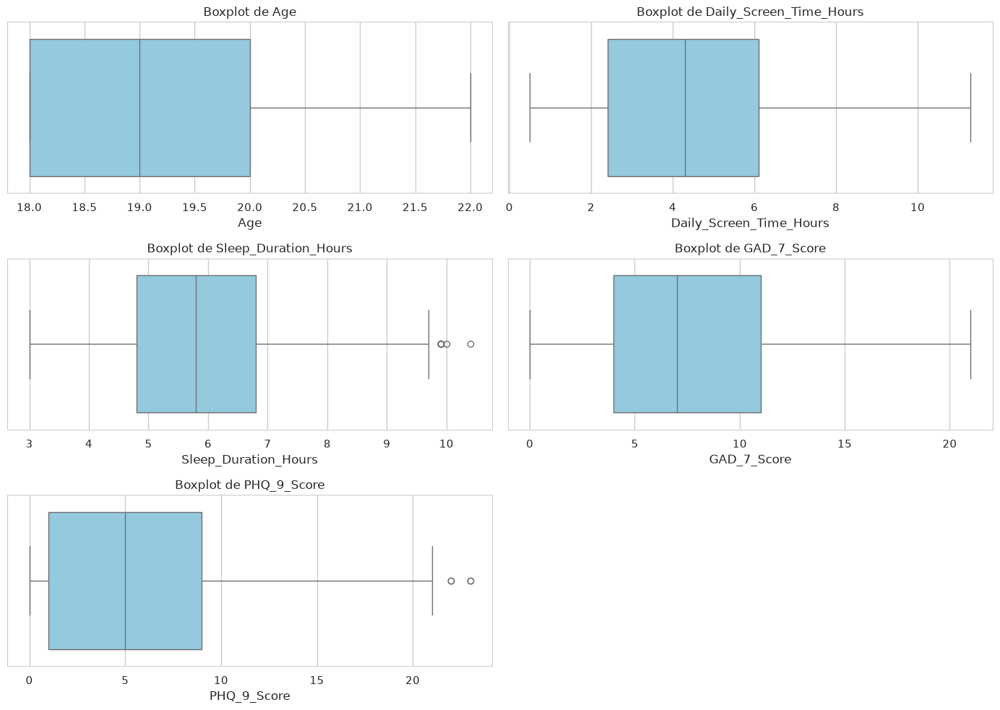

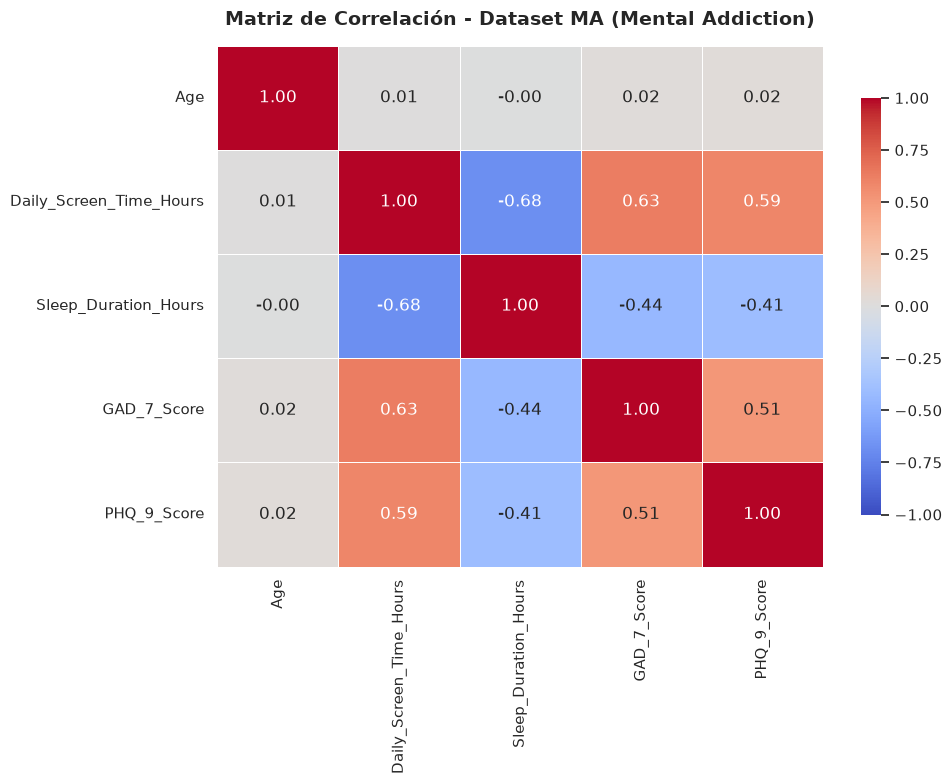


Correlación con GAD_7_Score:
GAD_7_Score                1.000000
Daily_Screen_Time_Hours    0.632002
PHQ_9_Score                0.509561
Age                        0.018160
Sleep_Duration_Hours      -0.440029
Name: GAD_7_Score, dtype: float64

   SCATTERPLOTS VS GAD_7_Score: Dataset mental addiction


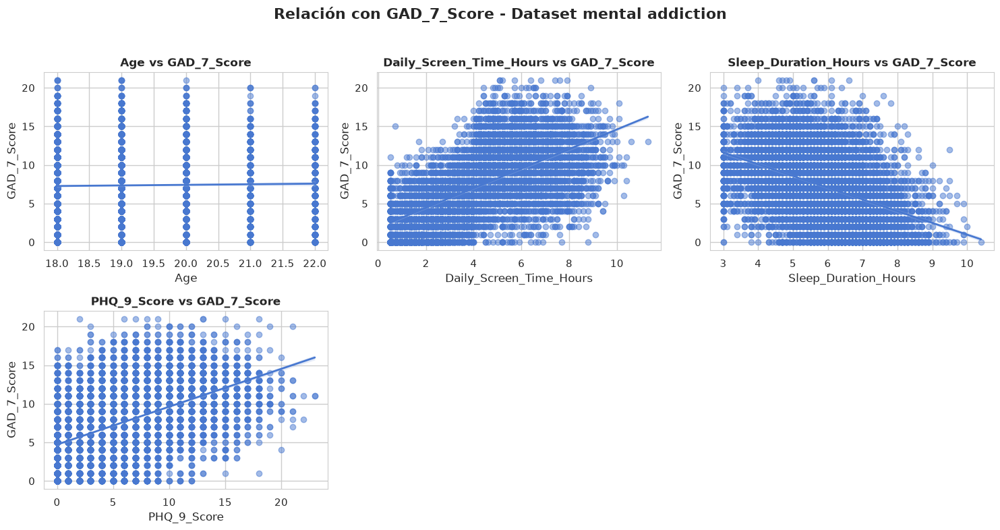


Correlación con PHQ_9_Score:
PHQ_9_Score                1.000000
Daily_Screen_Time_Hours    0.593372
GAD_7_Score                0.509561
Age                        0.024430
Sleep_Duration_Hours      -0.413701
Name: PHQ_9_Score, dtype: float64

   SCATTERPLOTS VS PHQ_9_Score: Dataset mental addiction


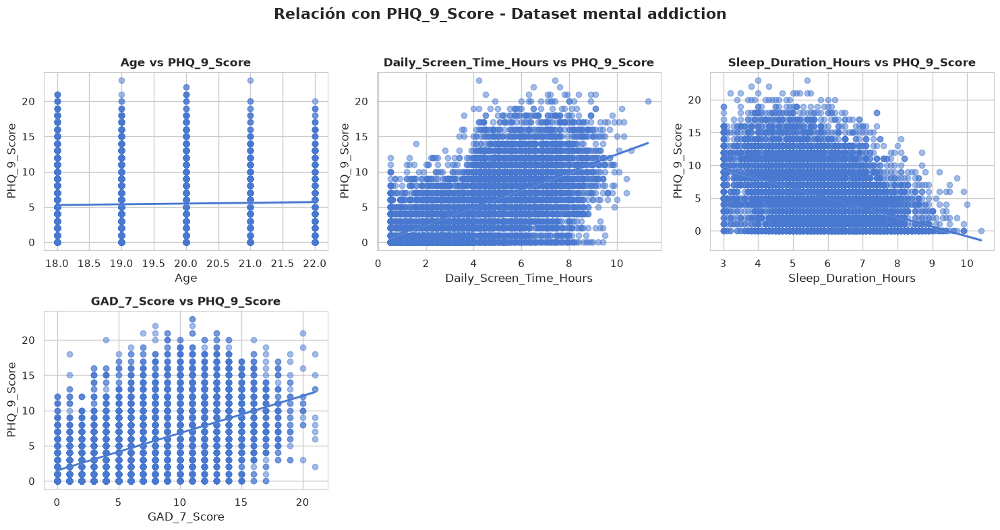


   ANÁLISIS DE VARIABLES CATEGÓRICAS: Dataset mental addiction

Generando distribución de variables categóricas...


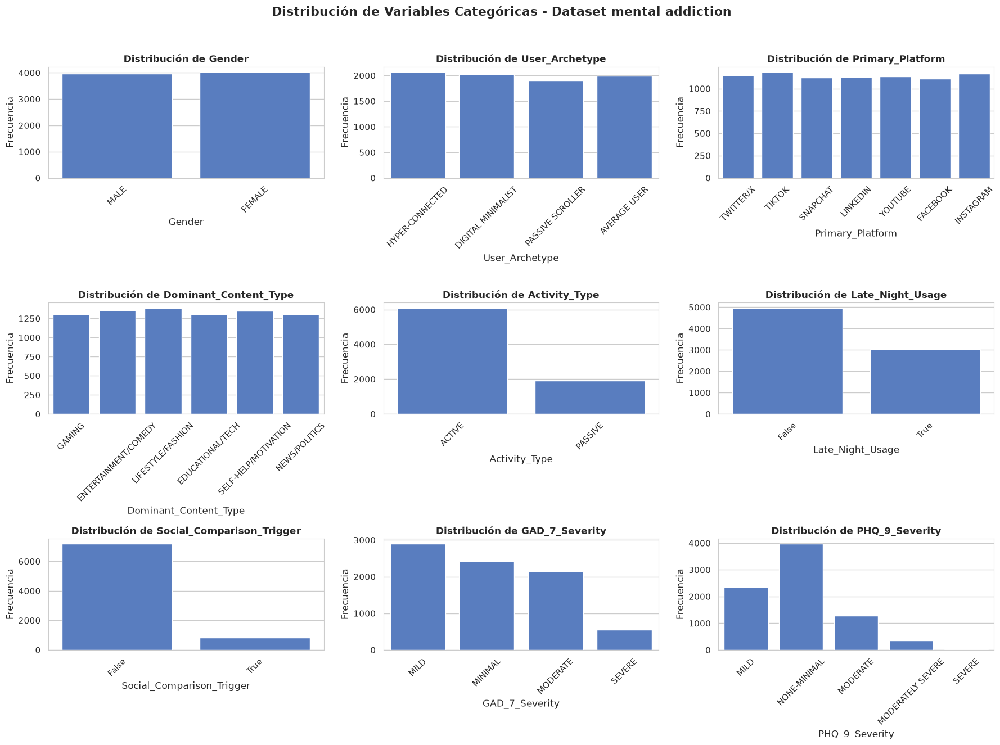


Generando boxplots de las variables categóricas vs GAD_7_Score...


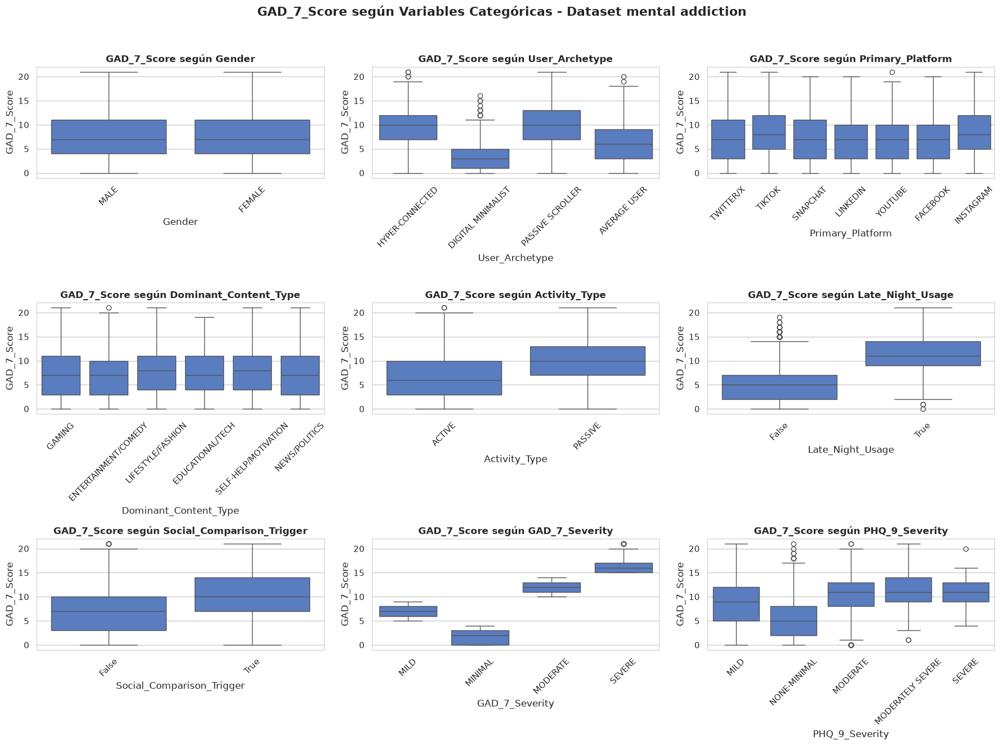


   ANÁLISIS DE VARIABLES CATEGÓRICAS: Dataset mental addiction

Generando distribución de variables categóricas...


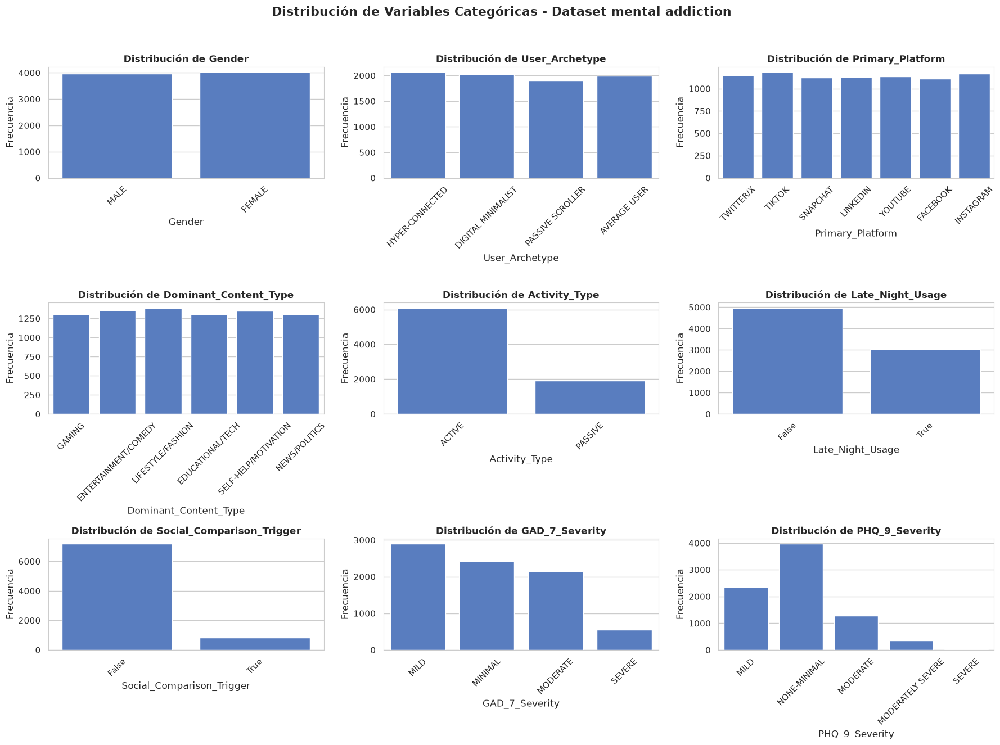


Generando boxplots de las variables categóricas vs PHQ_9_Score...


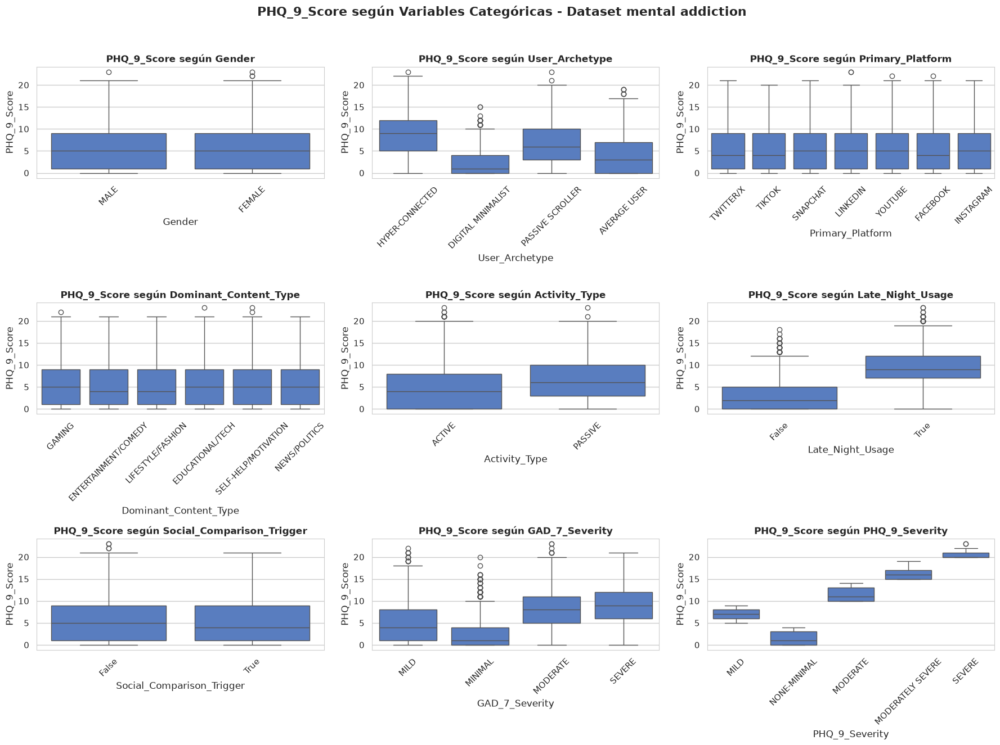

In [44]:
analizar_dataframe(ma_df, "Dataset MA (Mental Addiction)")
analizar_corr_target(ma_df,"Dataset mental addiction",target = "GAD_7_Score")
analizar_corr_target(ma_df,"Dataset mental addiction",target = "PHQ_9_Score")
analizar_categoricas(ma_df,"Dataset mental addiction",target = "GAD_7_Score")
analizar_categoricas(ma_df,"Dataset mental addiction",target = "PHQ_9_Score")